In [ ]:
from PIL import Image
from pathlib import Path
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import matplotlib.patches as mpatches
import hashlib
from sklearn.model_selection import train_test_split

In [ ]:
# Función que recibe la ruta de una imagen y devuelve el nombre de la carpeta donde está (NOMBRE DE LA CLASE)

def get_class(x):
    return x.parent.name

In [ ]:
# Juntamos las fotos

data_dir_total = r'data/Split_smol/'
valid_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.webp'}

files_totales = []

# Buscamos recursivamente en todas las subcarpetas
for x in Path(data_dir_total).rglob('*'):
    if x.is_file() and x.suffix.lower() in valid_extensions:
        try:
            with Image.open(x) as img:
                # Guardamos la ruta, la clase (nombre de la carpeta padre), resolución y modo
                files_totales.append((x, get_class(x), img.size, img.mode))
        except Exception:
            pass 

# Creamos el DataFrame con absolutamente todo el dataset original
df_completo = pd.DataFrame(files_totales, columns=["path", "class", "resolution", "mode"])

print(f"Total de imágenes encontradas en bruto: {len(df_completo)}")

Total de imágenes encontradas en bruto: 876


In [ ]:
# Filtramos duplicados 

# Función auxiliar para calcular el hash MD5 de cada archivo físico
def calcular_md5(path_objeto):
    hash_md5 = hashlib.md5()
    with open(path_objeto, "rb") as f:
        for chunk in iter(lambda: f.read(4096), b""):
            hash_md5.update(chunk)
    return hash_md5.hexdigest()

# Calculamos el hash para cada foto del DataFrame
df_completo['md5'] = df_completo['path'].apply(calcular_md5)

# Borramos los duplicados basándonos en el hash, dejando solo la primera aparición
df_limpio = df_completo.drop_duplicates(subset=['md5'], keep='first').reset_index(drop=True)

print(f"Total de imágenes después de eliminar duplicados: {len(df_limpio)}")


Total de imágenes después de eliminar duplicados: 843


In [ ]:
# Armamos los splits

# PASO 1: Separamos el 20% para el TEST FINAL
df_train_val, df_test = train_test_split(
    df_limpio, 
    test_size=0.20, 
    stratify=df_limpio['class'], 
    random_state=42
)

# PASO 2: Del 80% restante, separamos el 25% (que equivale al 20% del total general) para VALIDACIÓN
df_train, df_val = train_test_split(
    df_train_val, 
    test_size=0.25, 
    stratify=df_train_val['class'], 
    random_state=42
)

# Reseteamos los índices para que queden prolijos (0, 1, 2...)
df_train = df_train.reset_index(drop=True)
df_val = df_val.reset_index(drop=True)
df_test = df_test.reset_index(drop=True)


print(f"Cantidad en TRAIN (60%): {len(df_train)}")
print(f"Cantidad en VAL   (20%): {len(df_val)}")
print(f"Cantidad en TEST  (20%): {len(df_test)}")

Cantidad en TRAIN (60%): 505
Cantidad en VAL   (20%): 169
Cantidad en TEST  (20%): 169


# 0.  Introducción

El dataset contiene imágenes de 9 condiciones dermatológicas distintas, divididas en conjuntos de entrenamiento, validación, y testeo. Antes de entrenar cualquier modelo, es importante entender la estructura y características de los datos.

# 1. Distribucion de clases del dataset

La siguiente tabla muestra la cantidad de imágenes por clase en los conjuntos de entrenamiento, validación, y testeo.

In [ ]:
# Tabla resumen de distribucion de clases en el dataset 

train_counts = df_train.groupby("class").size().reset_index(name='Train')
val_counts = df_val.groupby("class").size().reset_index(name='Val')
test_counts = df_test.groupby("class").size().reset_index(name='Test') 

# Unimos las tres tablas 
tabla = train_counts.merge(val_counts, on='class', how='left')
tabla = tabla.merge(test_counts, on='class', how='left').fillna(0) 

tabla['Val'] = tabla['Val'].astype(int)
tabla['Test'] = tabla['Test'].astype(int) 

tabla['Total'] = tabla['Train'] + tabla['Val'] + tabla['Test']

tabla = tabla.sort_values('Total', ascending=False).reset_index(drop=True)
tabla.columns = ['Clase', 'Train', 'Val', 'Test', 'Total'] # <-- Sumamos 'Test' acá

tabla.style\
    .set_caption("Distribución de imágenes por clase (Split 60/20/20)")\
    .set_properties(**{
        'background-color': 'white',
        'color': '#333333',
        'border': '1px solid #f4a7b9',
        'text-align': 'center',
        'font-family': 'Georgia',
        'padding': '8px'
    })\
    .set_table_styles([{
        'selector': 'th',
        'props': [
            ('background-color', 'white'),
            ('color', '#333333'),
            ('font-size', '13px'),
            ('text-align', 'center'),
            ('padding', '10px'),
            ('border-bottom', '2px solid #f4a7b9')
        ]
    }, {
        'selector': 'caption',
        'props': [
            ('font-size', '15px'),
            ('color', '#333333'),
            ('font-weight', 'bold'),
            ('padding', '10px')
        ]
    }])\
    .highlight_min(subset=['Train'], color='#fce4ec')

,Clase,Train,Val,Test,Total
0,Actinic keratosis,60,20,20,100
1,Benign keratosis,60,20,20,100
2,Dermatofibroma,60,20,20,100
3,Melanocytic nevus,60,20,20,100
4,Melanoma,60,20,20,100
5,Vascular lesion,60,20,20,100
6,Squamous cell carcinoma,60,20,20,100
7,Atopic Dermatitis,48,16,16,80
8,Tinea Ringworm Candidiasis,37,13,13,63


Como se puede observar en la tabla, el dataset mantiene de forma proporcional la distribución original de las clases gracias al split estratificado (60% TRAIN, 20% VAL y 20% TEST). 

Sin embargo, la clase **Tinea Ringworm Candidiasis** (resaltada en rosa) cuenta de fábrica con menos imágenes en el total general, lo que se refleja en una cantidad menor de muestras en todos los subconjuntos. Esta discrepancia en el volumen de datos por clase será abordada más adelante mediante técnicas de **Data Augmentation** específicas durante el entrenamiento.

A su vez, se puede visualizar la misma informacion de manera mas visual en el siguiente histograma.

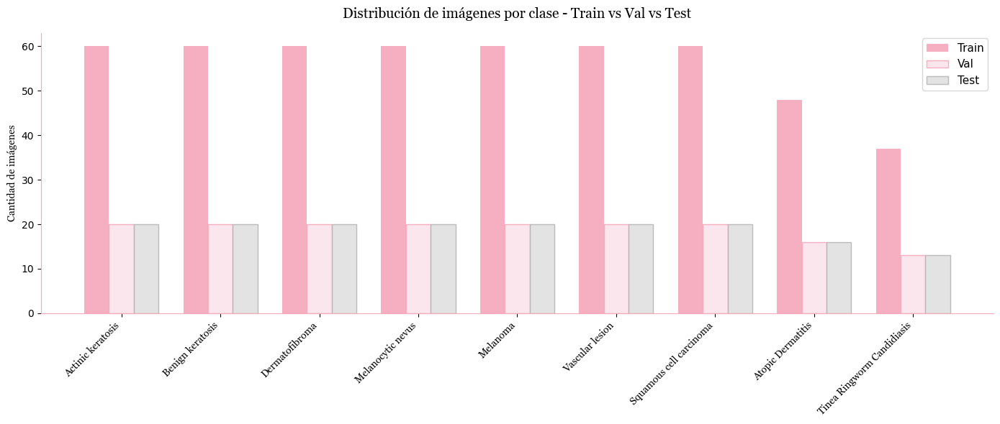

In [ ]:
# Histograma mostrando cuántas imágenes hay de cada clase, comparando Train, Val y Test

train_cls = df_train.groupby("class").size().reset_index(name='count_train')
val_cls = df_val.groupby("class").size().reset_index(name='count_val')
test_cls = df_test.groupby("class").size().reset_index(name='count_test') 

# Unimos las tres distribuciones
merged_cls = train_cls.merge(val_cls, on='class', how='left')
merged_cls = merged_cls.merge(test_cls, on='class', how='left').fillna(0)
merged_cls = merged_cls.sort_values('count_train', ascending=False)

x = np.arange(len(merged_cls))
width = 0.25

fig, ax = plt.subplots(figsize=(14, 6)) 

ax.bar(x - width, merged_cls['count_train'], width, label='Train', color='#f4a7b9', alpha=0.9)
ax.bar(x, merged_cls['count_val'], width, label='Val', color='#fce4ec', edgecolor='#f4a7b9', linewidth=1, alpha=0.9)
ax.bar(x + width, merged_cls['count_test'], width, label='Test', color='#e0e0e0', edgecolor='#b5b5b5', linewidth=1, alpha=0.9) 

ax.set_xticks(x)
ax.set_xticklabels(merged_cls['class'], rotation=45, ha='right', fontfamily='Georgia')
ax.set_ylabel('Cantidad de imágenes', fontfamily='Georgia')
ax.set_title('Distribución de imágenes por clase - Train vs Val vs Test', fontfamily='Georgia', fontsize=14, pad=15)
ax.legend(fontsize=11)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#f4a7b9')
ax.spines['bottom'].set_color('#f4a7b9')

plt.tight_layout()
plt.show()

# 2. Distribucion de resoluciones del dataset

La siguiente tabla muestra la cantidad de imágenes de cada resolucion (tamaño) en los conjuntos de entrenamiento, validación, y testeo; para las 9 clases. 


In [ ]:
# Tabla resumen de resoluciones más frecuentes 

train_res = df_train.groupby("resolution").size().reset_index(name='Train')
val_res = df_val.groupby("resolution").size().reset_index(name='Val')
test_res = df_test.groupby("resolution").size().reset_index(name='Test') 

tabla_res = train_res.merge(val_res, on='resolution', how='left')
tabla_res = tabla_res.merge(test_res, on='resolution', how='left').fillna(0) 

tabla_res['Val'] = tabla_res['Val'].astype(int)
tabla_res['Test'] = tabla_res['Test'].astype(int) 

tabla_res['Total'] = tabla_res['Train'] + tabla_res['Val'] + tabla_res['Test'] 

tabla_res = tabla_res.sort_values('Train', ascending=False).head(10).reset_index(drop=True)
tabla_res.columns = ['Resolución', 'Train', 'Val', 'Test', 'Total'] 

tabla_res.style\
    .set_caption("Top 10 resoluciones más frecuentes (Dataset Completo)")\
    .set_properties(**{
        'background-color': 'white',
        'color': '#333333',
        'border': '1px solid #f4a7b9',
        'text-align': 'center',
        'font-family': 'Georgia',
        'padding': '8px'
    })\
    .set_table_styles([{
        'selector': 'th',
        'props': [
            ('background-color', 'white'),
            ('color', '#333333'),
            ('font-size', '13px'),
            ('text-align', 'center'),
            ('padding', '10px'),
            ('border-bottom', '2px solid #f4a7b9')
        ]
    }, {
        'selector': 'caption',
        'props': [
            ('font-size', '15px'),
            ('color', '#333333'),
            ('font-weight', 'bold'),
            ('padding', '10px')
        ]
    }])

,Resolución,Train,Val,Test,Total
0,"(600, 450)",240,80,80,400
1,"(1024, 768)",84,23,28,135
2,"(1024, 764)",48,9,17,74
3,"(294, 222)",48,16,16,80
4,"(1022, 767)",11,7,3,21
5,"(767, 576)",7,2,3,12
6,"(1024, 683)",3,0,0,3
7,"(1024, 686)",2,0,0,2
8,"(300, 213)",2,0,0,2
9,"(1024, 681)",2,3,0,5


El dataset presenta una gran variedad de resoluciones, siendo la más común **(600, 450)** con 400 imágenes en total. Dado que las imágenes tienen distintos tamaños, es necesario redimensionarlas todas a una resolución fija antes de entrenar. 

A su vez, se puede visualizar la misma informacion de manera mas visual en el siguiente histograma.

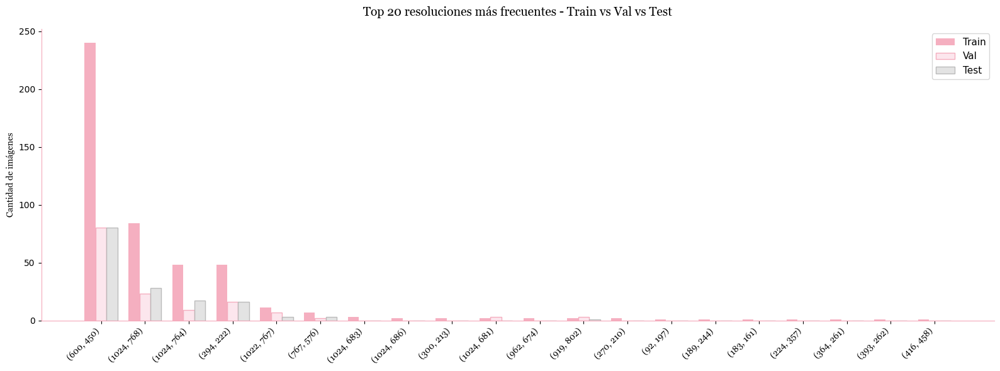

In [ ]:
# Histograma mostrando cuántas imágenes hay de cada resolución, comparando Train, Val y Test

train_res = df_train.groupby("resolution").size().reset_index(name='count_train')
val_res = df_val.groupby("resolution").size().reset_index(name='count_val')
test_res = df_test.groupby("resolution").size().reset_index(name='count_test') 

# Unimos las tres distribuciones de resoluciones
merged = train_res.merge(val_res, on='resolution', how='left')
merged = merged.merge(test_res, on='resolution', how='left').fillna(0)


merged = merged.sort_values('count_train', ascending=False).head(20)

x = np.arange(len(merged))
width = 0.25

fig, ax = plt.subplots(figsize=(16, 6)) 

ax.bar(x - width, merged['count_train'], width, label='Train', color='#f4a7b9', alpha=0.9)
ax.bar(x, merged['count_val'], width, label='Val', color='#fce4ec', edgecolor='#f4a7b9', linewidth=1, alpha=0.9)
ax.bar(x + width, merged['count_test'], width, label='Test', color='#e0e0e0', edgecolor='#b5b5b5', linewidth=1, alpha=0.9) 

ax.set_xticks(x)

labels = [str(r) for r in merged['resolution']]
ax.set_xticklabels(labels, rotation=45, ha='right', fontfamily='Georgia')

ax.set_ylabel('Cantidad de imágenes', fontfamily='Georgia')
ax.set_title('Top 20 resoluciones más frecuentes - Train vs Val vs Test', fontfamily='Georgia', fontsize=14, pad=15)
ax.legend(fontsize=11)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#f4a7b9')
ax.spines['bottom'].set_color('#f4a7b9')

plt.tight_layout()
plt.show()

# 3. ¿Hay imágenes que no son RGB?

In [ ]:
# Verificar si hay imágenes que no son RGB 

no_rgb_train = df_train[df_train["mode"] != "RGB"]
no_rgb_val   = df_val[df_val["mode"] != "RGB"]
no_rgb_test  = df_test[df_test["mode"] != "RGB"] 

resumen = pd.DataFrame({
    "Split": ["Train", "Val", "Test"], 
    "Imágenes no RGB": [len(no_rgb_train), len(no_rgb_val), len(no_rgb_test)], 
    "Total imágenes": [len(df_train), len(df_val), len(df_test)] 
})

resumen.style\
    .set_caption("Sanity check: imágenes no RGB (Dataset Completo)")\
    .set_properties(**{
        'background-color': 'white',
        'color': '#333333',
        'border': '1px solid #f4a7b9',
        'text-align': 'center',
        'font-family': 'Georgia',
        'padding': '8px'
    })\
    .set_table_styles([{
        'selector': 'th',
        'props': [
            ('background-color', 'white'),
            ('color', '#333333'),
            ('font-size', '13px'),
            ('text-align', 'center'),
            ('padding', '10px'),
            ('border-bottom', '2px solid #f4a7b9')
        ]
    }, {
        'selector': 'caption',
        'props': [
            ('font-size', '15px'),
            ('color', '#333333'),
            ('font-weight', 'bold'),
            ('padding', '10px')
        ]
    }])\
    .apply(lambda col: ['background-color: #fce4ec' if v > 0 else '' for v in col], subset=['Imágenes no RGB'])

,Split,Imágenes no RGB,Total imágenes
0,Train,0,505
1,Val,0,169
2,Test,0,169


Como se puede ver en la tabla de arriba, todo el dataset son imagenes RGB.

# 4. Ejemplos visuales de cada clase 

## 4.a. 5 imagenes por clase de entrenamiento

A continuación se muestran 5 imágenes de cada clase del conjunto de **TRAIN**. 

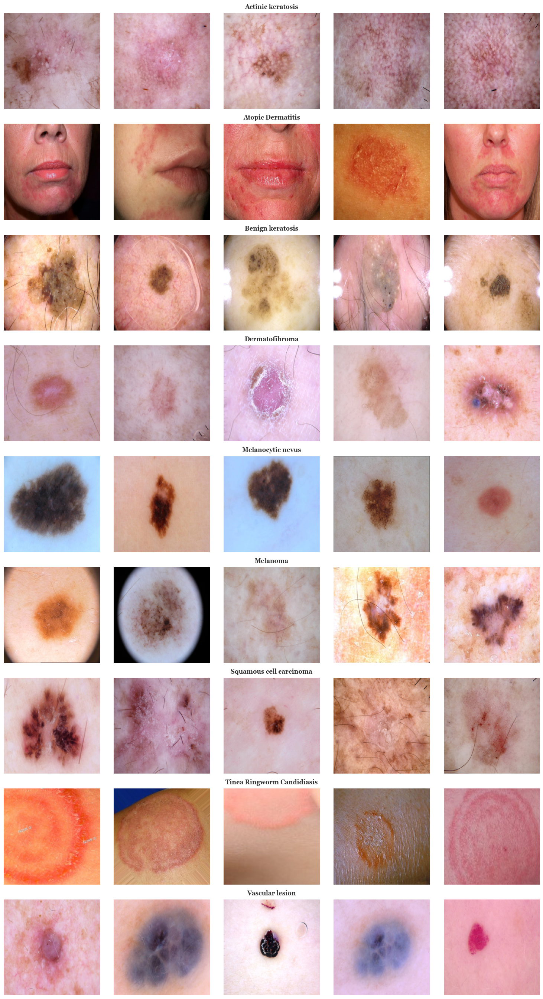

In [ ]:
n_imgs = 5
classes = sorted(df_train["class"].unique())
n_classes = len(classes)

fig, axes = plt.subplots(nrows=n_classes, ncols=n_imgs, figsize=(15, 3 * n_classes))

aux_df = df_train.sort_values("class").groupby("class").head(n_imgs).reset_index(drop=True)

idx = 0
for row in range(n_classes):
    cls = classes[row]
   
    clase_df = aux_df[aux_df["class"] == cls]
    
    for col in range(n_imgs):
        ax = axes[row, col]
        
        
        if col < len(clase_df):
            img_path = clase_df["path"].iloc[col]
            try:
                with Image.open(img_path) as img:
                    img_resized = img.resize((224, 224))
                    ax.imshow(img_resized)
            except Exception:
                ax.text(0.5, 0.5, "Error al abrir", ha="center", va="center")
        
        ax.axis('off')

    axes[row, 2].set_title(cls, fontsize=12, fontweight='bold', 
                           color='#333333', fontfamily='Georgia', pad=8)

plt.tight_layout()
plt.show()

## 4.b. 5 imagenes por clase de validación

A continuación se muestran 5 imágenes de cada clase del conjunto de **VAL**. 

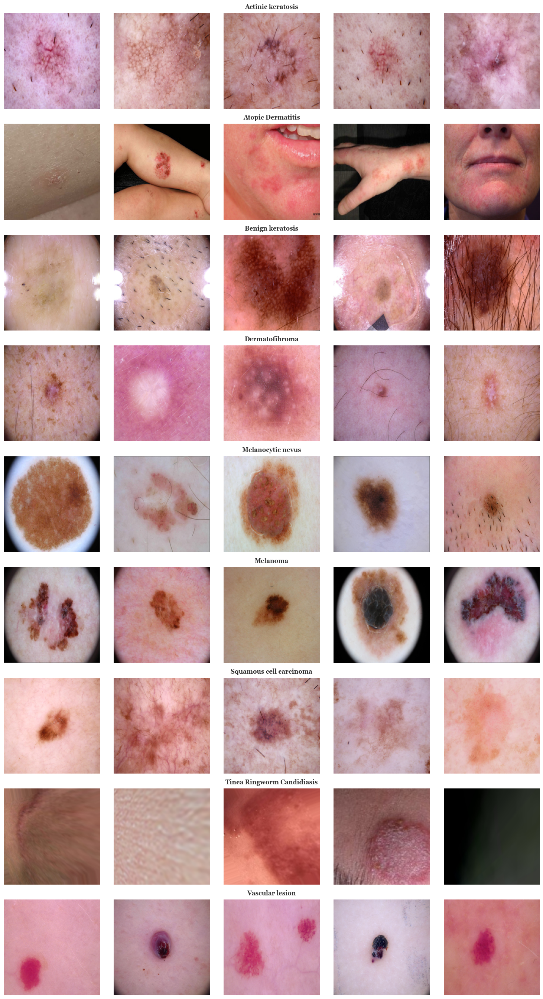

In [ ]:
# Muestra 5 imágenes por cada una de las 9 clases del conjunto de VAL.

n_imgs = 5
classes = sorted(df_val["class"].unique())
n_classes = len(classes)

fig, axes = plt.subplots(nrows=n_classes, ncols=n_imgs, figsize=(15, 3 * n_classes))

aux_df_val = df_val.sort_values("class").groupby("class").head(n_imgs).reset_index(drop=True)

for row in range(n_classes):
    cls = classes[row]
    clase_df = aux_df_val[aux_df_val["class"] == cls]
    
    for col in range(n_imgs):
        ax = axes[row, col]
        
        if col < len(clase_df):
            img_path = clase_df["path"].iloc[col]
            try:
                with Image.open(img_path) as img:
                    img_resized = img.resize((224, 224))
                    ax.imshow(img_resized)
            except Exception:
                ax.text(0.5, 0.5, "Error al abrir", ha="center", va="center")
        
        ax.axis('off')
    
  
    axes[row, 2].set_title(cls, fontsize=12, fontweight='bold', 
                           color='#333333', fontfamily='Georgia', pad=8)

plt.tight_layout()
plt.show()

# 5. Varianza intra-clase (TRAIN VS VAL VS TEST)

La varianza intra-clase mide qué tan distintas son las imágenes dentro de una misma clase. Una varianza alta indica que el modelo tendrá más dificultad aprendiendo patrones consistentes, y que técnicas como data augmentation y regularización serán más necesarias. Se compara train, val y test para verificar consistencia.

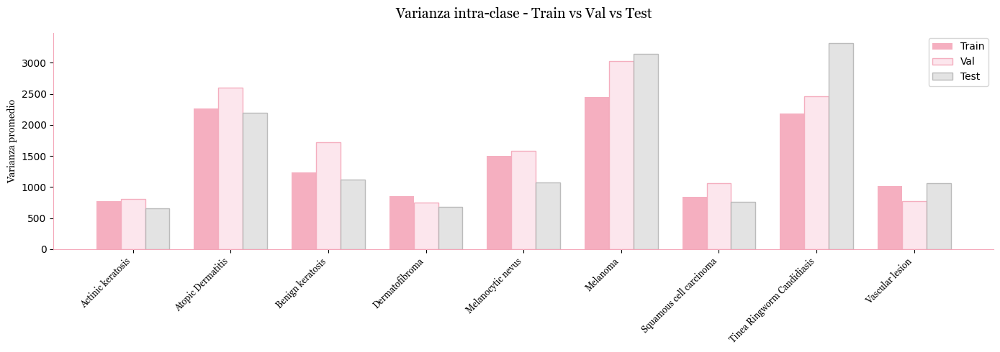

In [ ]:
# Varianza intra-clase (Train vs Val vs Test)

target_size = (64, 64)
classes = sorted(df_train["class"].unique())

varianzas_train = {}
varianzas_val = {}
varianzas_test = {} 

def calcular_varianza_split(df_split):
    varianzas = {}
    for cls in classes:
        paths = df_split[df_split["class"] == cls]["path"]
        flat_imgs = []
        for path in paths:
            try:
                with Image.open(path) as img:
                    img_flat = np.array(img.convert("RGB").resize(target_size)).flatten()
                    flat_imgs.append(img_flat)
            except Exception:
                pass
        if flat_imgs:
            varianzas[cls] = np.array(flat_imgs).var(axis=0).mean()
        else:
            varianzas[cls] = 0
    return varianzas

# Calculamos las varianzas para los 3 conjuntos 
varianzas_train = calcular_varianza_split(df_train)
varianzas_val = calcular_varianza_split(df_val)
varianzas_test = calcular_varianza_split(df_test) 

# Gráfico de Barras Agrupadas
x = np.arange(len(classes))
width = 0.25 

fig, ax = plt.subplots(figsize=(14, 5))


ax.bar(x - width, [varianzas_train[c] for c in classes], width, 
       label='Train', color='#f4a7b9', alpha=0.9)

ax.bar(x, [varianzas_val[c] for c in classes], width, 
       label='Val', color='#fce4ec', edgecolor='#f4a7b9', linewidth=1, alpha=0.9)

ax.bar(x + width, [varianzas_test[c] for c in classes], width, 
       label='Test', color='#e0e0e0', edgecolor='#b5b5b5', linewidth=1, alpha=0.9) 

ax.set_xticks(x)
ax.set_xticklabels(classes, rotation=45, ha='right', fontsize=9, fontfamily='Georgia')
ax.set_ylabel('Varianza promedio', fontfamily='Georgia')
ax.set_title('Varianza intra-clase - Train vs Val vs Test', fontsize=14, pad=15, fontfamily='Georgia')
ax.legend(fontsize=10)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#f4a7b9')
ax.spines['bottom'].set_color('#f4a7b9')

plt.tight_layout()
plt.show()

# 6. Imagenes Atípicas por Clase en TRAIN


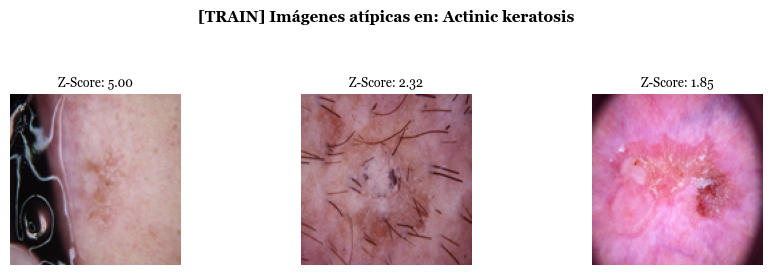

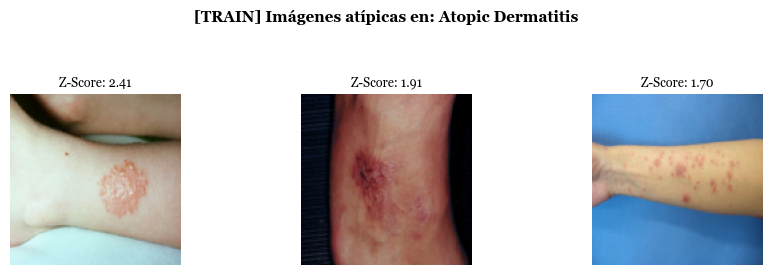

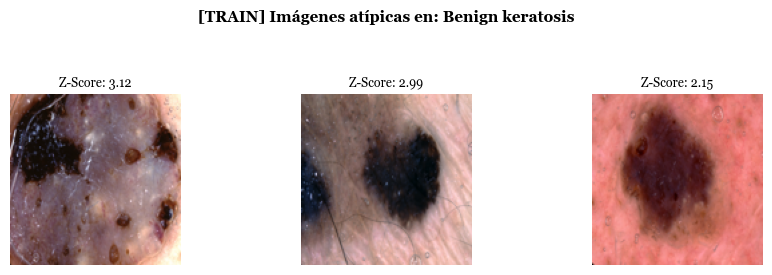

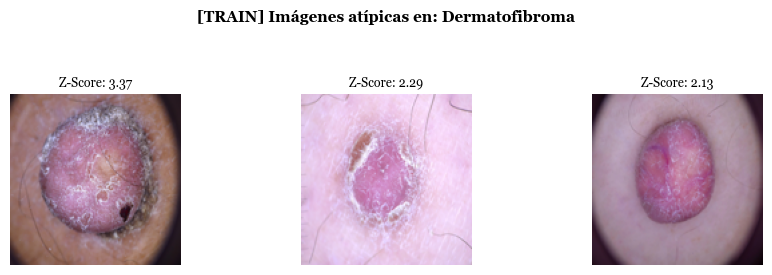

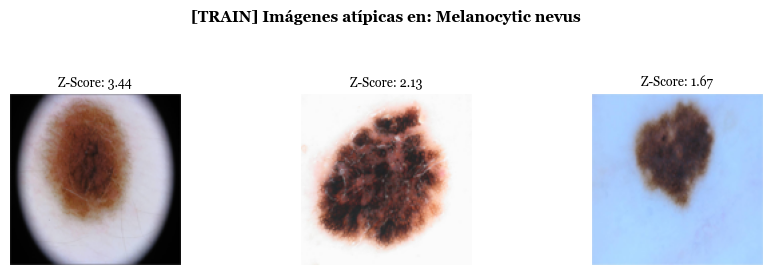

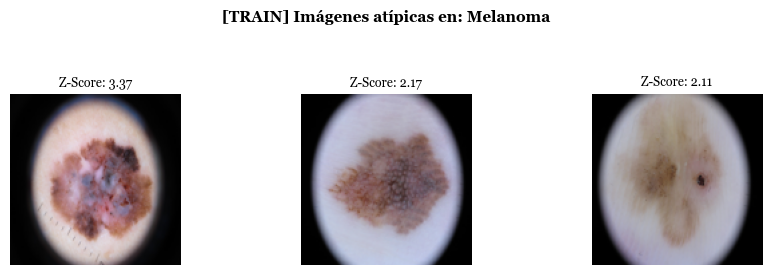

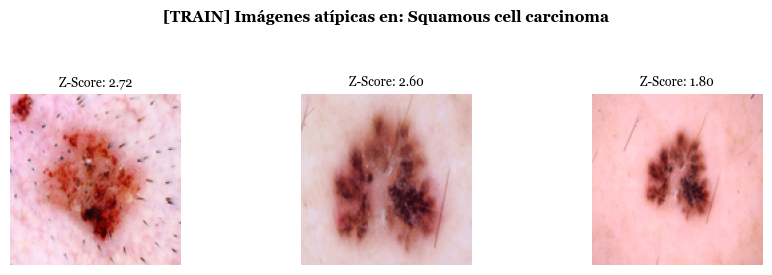

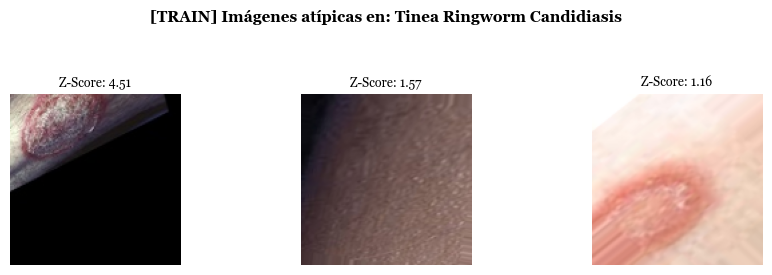

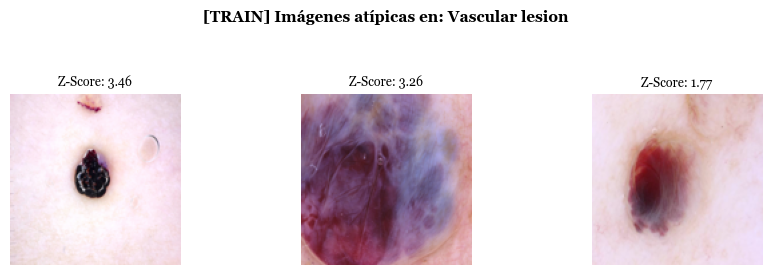

In [ ]:
# Detección de imágenes atípicas (Outliers) en TRAIN

target_size = (64, 64)
n_outliers_to_show = 3

classes_train = sorted(df_train["class"].unique())

for cls in classes_train:
    paths = df_train[df_train["class"] == cls]["path"].values
    if len(paths) == 0:
        continue
        
    flat_imgs = []
    paths_exitosos = [] 
    
    for path in paths:
        try:
            with Image.open(path) as img:
                flat_vector = np.array(img.convert("RGB").resize(target_size)).flatten()
                flat_imgs.append(flat_vector)
                paths_exitosos.append(path) 
        except Exception:
            pass
            
    if not flat_imgs:
        continue
        
    imgs_array = np.array(flat_imgs)
    mean_vector = imgs_array.mean(axis=0)
    
    distancias = np.linalg.norm(imgs_array - mean_vector, axis=1)
    valid_paths = np.array(paths_exitosos) 
    
    mean_dist = np.mean(distancias)
    std_dist = np.std(distancias) if np.std(distancias) > 0 else 1
    z_scores = (distancias - mean_dist) / std_dist
    
    idx_anormales = np.argsort(z_scores)[::-1][:n_outliers_to_show]
    
    fig, axes = plt.subplots(1, n_outliers_to_show, figsize=(9, 2.5))
    fig.suptitle(f"[TRAIN] Imágenes atípicas en: {cls}", 
                 fontsize=11, fontweight='bold', fontfamily='Georgia', y=1.08)
    
    for idx_ax, idx_img in enumerate(idx_anormales):
        ax = axes[idx_ax]
        if idx_img < len(valid_paths):
            img_path = valid_paths[idx_img]
            z_val = z_scores[idx_img]
            
            try:
                with Image.open(img_path) as img:
                    ax.imshow(img.resize((128, 128)))
                ax.set_title(f"Z-Score: {z_val:.2f}", fontsize=9, fontfamily='Georgia')
            except Exception:
                ax.text(0.5, 0.5, "Error", ha="center", va="center")
        
        ax.axis('off')
        
    plt.tight_layout()
    plt.show()

# 7. Conclusiones del EDA

## Dataset y Splits (60/20/20)
Distribución: El dataset quedó balanceado gracias al split estratificado virtual. 

La excepción: Tinea Ringworm Candidiasis es la menos representada.

## Resoluciones y Formato
La resolución más común sigue siendo (600, 450) pero hay mucha variedad, por lo que se redimensionará todo a un tamaño fijo. Todo el conjunto está verificado en formato RGB.

## Integridad de Datos (Sin Data Leakage)
Solucionado de raíz: Al unificar todo el dataset y limpiar los duplicados por hash MD5 antes de hacer la separación de conjuntos, se eliminó el 100% del Data Leakage. Ya no existen fotos repetidas dentro de un mismo split ni imágenes cruzadas entre TRAIN, VAL y TEST.

## Varianza Intra-clase
Melanoma y Atopic Dermatitis: Tienen la varianza más alta en los tres grupos. Son clases muy heterogéneas en formas, colores y pieles, por lo que serán las más complejas para el modelo.

Actinic Keratosis y Dermatofibroma: Son las más homogéneas y fáciles de aprender.
